# WikiArt Multimodal Retrieval

Этот ноутбук демонстрирует полный пайплайн решения: предобработка данных и работа трёх режимов поиска (Image -> Image, Caption -> Image, Omni -> Image).

Также тут продемонстрированы сгенерированные данные.

## 1. Импорт и подготовка окружения

In [1]:
from pathlib import Path
import sys
import json

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

project_root = Path.cwd().parent
if str(project_root) not in sys.path:
    sys.path.append(str(project_root))

from src.pipeline import build_corpus

In [2]:
# Запускаем скрипт по предобработке данных
# Он будет стримить первые 5000 записей датасета wikiart, предобрабатывая каждую (создавая эмбеддинги к картикам, генерирую описания и эмбединги к ним, а также создавая теги)

# build_corpus(sample_size=5000)

# ! Данная команда была выполнена в консольном режиме (вне блокнота), поэтому не имеет вывода !

## 2. Просмотр сгенерированных описаний и тегов

In [3]:
def print_separator():
    print("\n" + "="*40 + "\n")

def draw_image(image_path: str):
    img = plt.imread(image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

def draw_image_line(image_paths: list[str], captions: list[str] | None = None):
    fig, axes = plt.subplots(1, len(image_paths), figsize=(15, 5))
    for ax, image_path in zip(axes, image_paths):
        img = plt.imread(image_path)
        ax.imshow(img)
        ax.axis('off')
    if captions:
        for ax, caption in zip(axes, captions):
            ax.set_title(caption)
    plt.show()

def draw_image_grid(image_paths: list[list[str]], captions: list[list[str]] | None = None):
    cols, rows = len(image_paths), len(image_paths[0])
    fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    for i in range(rows):
        for j in range(cols):
            img = plt.imread(image_paths[j][i])
            if captions:
                axes[i, j].set_title(captions[j][i])
            axes[i, j].imshow(img)
            axes[i, j].axis('off')
    plt.show()

Image path: artifacts\images\sample_0.jpg


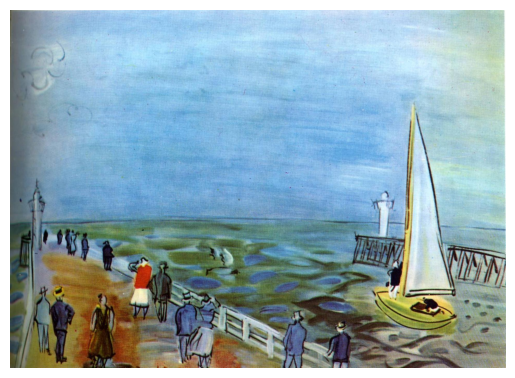

Caption: there is a painting of people walking on the beach with a sailboat


Image path: artifacts\images\sample_1.jpg


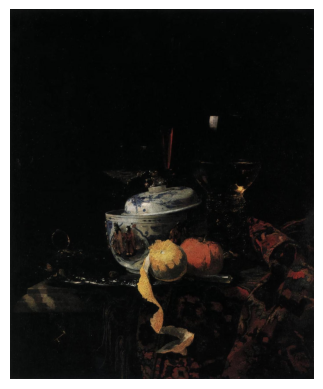

Caption: there is a painting of a bowl of fruit and a candle on a table


Image path: artifacts\images\sample_2.jpg


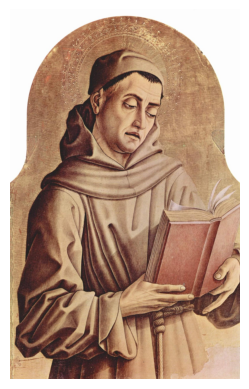

Caption: an image of a painting of a man reading a book


Image path: artifacts\images\sample_3.jpg


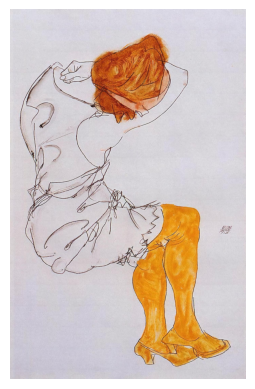

Caption: there is a drawing of a woman sitting on the ground with her legs crossed


Image path: artifacts\images\sample_4.jpg


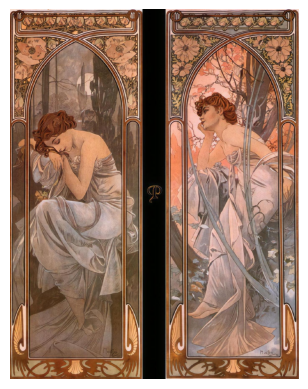

Caption: there are two paintings of a woman sitting on a bench




In [4]:
metadata_data = pd.read_parquet(project_root / "artifacts" / "datasets" / "omni_metadata.parquet")

for idx, row in metadata_data.head(5).iterrows():
    print(f"Image path: {row['image_path']}")
    draw_image(project_root / row['image_path'])
    print(f"Caption: {row['caption']}")
    print_separator()

Стоит отметить, что сами описания весьма общие, но при этом довольно хорошо совпадающие с самой картиной. В целом это и не хорошо и не плохо (система поиска будет работать лучше из-за отсутствия смещающих деталей, но при этом будет не супер точна).

Стоит также отметить, что не на всех картинках описательная модель справилась хоть сколько хорошо. Например, `sample_1.jpg` имеет некорректное описание (хотя и мне сложно понять, что там изображено).

In [5]:
with open(project_root / "artifacts" / "indexes" / "labels" / "omni_tags.json", "r", encoding="utf-8") as fin:
    omni_tags = json.load(fin)
    print(f"Tags: {', '.join(omni_tags)} ...")

Tags: Renaissance, Impressionism, Expressionism, Baroque, Cubism, Romanticism, Symbolism, Surrealism, Abstract Art, Pop Art, Realism, Contemporary, portrait painting, landscape painting, religious art, genre painting, still life painting, abstract composition, cityscape, mythological scene, nude painting, melancholic scene, dramatic lighting, cheerful colors, dark and moody, calm and serene, energetic movement ...


Некоторые из тегов совпадают с жанрами (из-за того, что это в целом хороший сепаратор), а некоторые основаны на общем описании деталей.

In [6]:
all_image_paths = metadata_data['image_path'].tolist()
all_captions = metadata_data['caption'].tolist()

## 3. Просмотр примеров работы Image2Image

Error loading artifacts\type_mappings\artist.csv: [Errno 2] No such file or directory: 'artifacts\\type_mappings\\artist.csv'
Error loading artifacts\type_mappings\genre.csv: [Errno 2] No such file or directory: 'artifacts\\type_mappings\\genre.csv'
Error loading artifacts\type_mappings\style.csv: [Errno 2] No such file or directory: 'artifacts\\type_mappings\\style.csv'
Initializing Annoy index: dim=512, metric=angular, n_trees=64
Initializing Annoy index: dim=512, metric=angular, n_trees=64
Initializing Annoy index: dim=27, metric=angular, n_trees=64




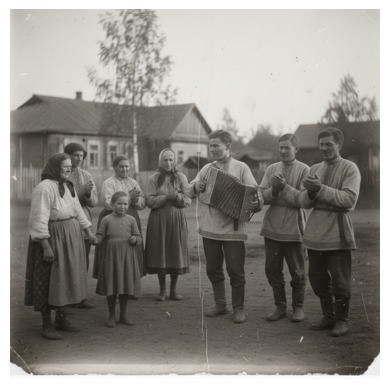

Reference image




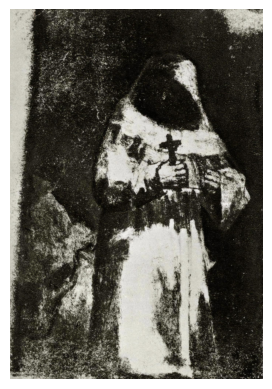

Generated caption:
there is a black and white drawing of a nun holding a cross
Rank 1:
ID: sample_2014
Artist: francisco-goya
Style: Romanticism
Genere: genre_painting
Score: 0.7716




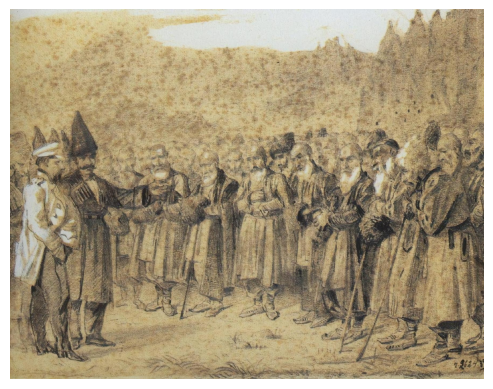

Generated caption:
there is a drawing of a group of men standing in front of a crowd
Rank 2:
ID: sample_4654
Artist: vasily-vereshchagin
Style: Realism
Genere: genre_painting
Score: 0.7700




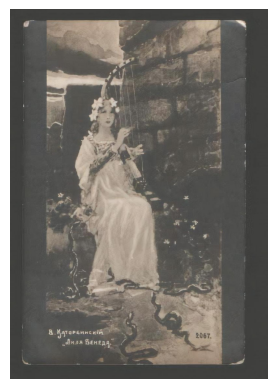

Generated caption:
there is an old photo of a woman sitting on a chair
Rank 3:
ID: sample_3292
Artist: Unknown Artist
Style: Art_Nouveau
Genere: genre_painting
Score: 0.7353




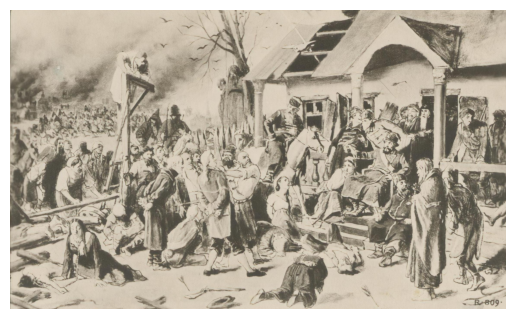

Generated caption:
there is a drawing of a crowd of people gathered around a building
Rank 4:
ID: sample_2203
Artist: vasily-perov
Style: Realism
Genere: genre_painting
Score: 0.7204




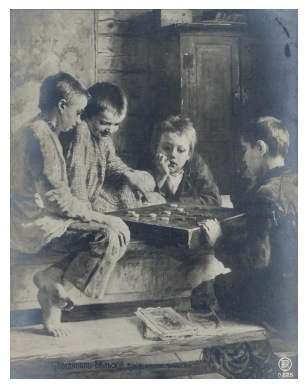

Generated caption:
this is an old photo of a group of children reading a book
Rank 5:
ID: sample_508
Artist: nikolay-bogdanov-belsky
Style: Realism
Genere: genre_painting
Score: 0.7164




In [7]:
from demo import image_to_image, set_new_mapping_location

set_new_mapping_location(project_root / "artifacts" / "type_mappings")

reference_image = str(project_root / "artifacts" / "test" / "test.png")
result = image_to_image(query_image=reference_image, top_k=5)

print_separator()
draw_image(reference_image)
print("Reference image")
print_separator()
for idx, (img_path, id, artist, style, genere, caption, score) in enumerate(result[::-1]):
    draw_image(str(img_path))
    print("Generated caption:")
    print(caption)
    print(f"Rank {idx + 1}:")
    print(f"ID: {id}")
    print(f"Artist: {artist}")
    print(f"Style: {style}")
    print(f"Genere: {genere}")
    print(f"Score: {score}")
    print_separator()

Результат довольно хороший: почти везде есть группа людей, сами картинки выполнены в монохромных тонах, а время найденных картин не напоминает современность (что подходит изначальной картинке).

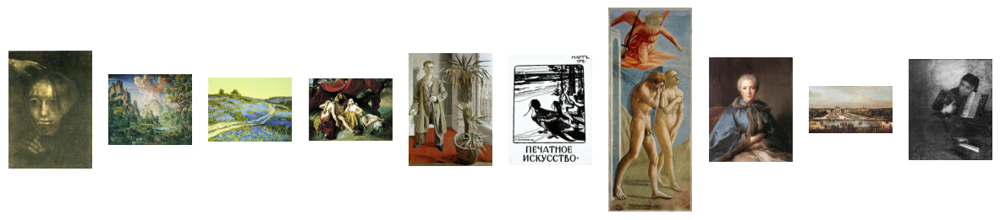

Random images from the corpus




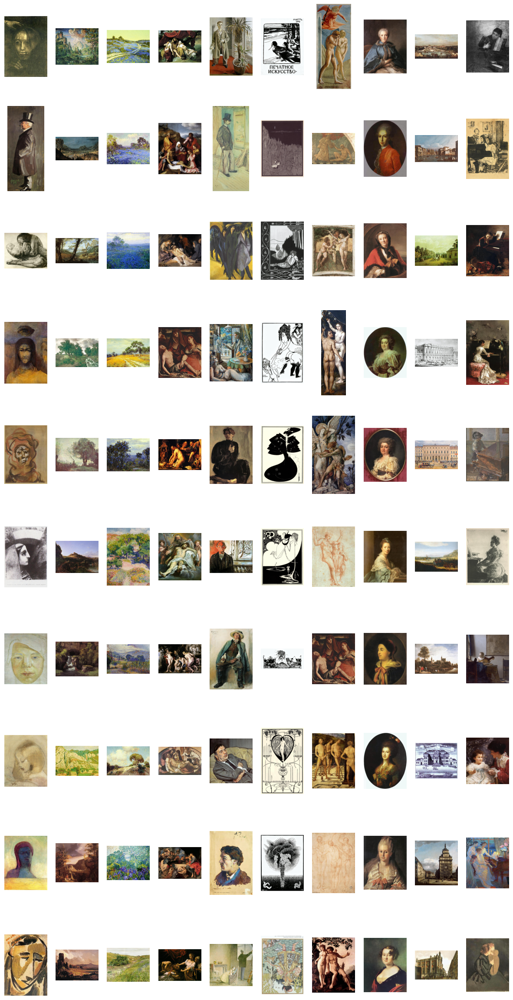

In [8]:
import random

random_images = random.sample(all_image_paths, 10)
prediction_image = [
    [
        str(project_root / res[0])
        for res in image_to_image(query_image=str(project_root / img_path), top_k=10)
    ]
    for img_path in random_images
]


draw_image_line([project_root / img_path for img_path in random_images])
print("Random images from the corpus")
print_separator()
draw_image_grid(prediction_image)

## 4. Просмотр примеров работы Caption2Image



Query text: A young boy on a horse




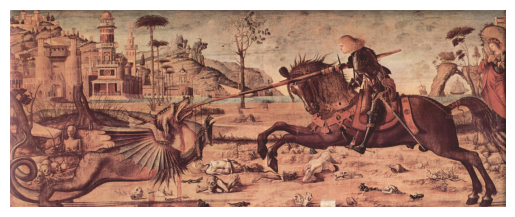

Generated caption:
there is a painting of a man on a horse with a sword
Rank 1:
ID: sample_1899
Artist: Unknown Artist
Style: High_Renaissance
Genere: religious_painting
Score: 0.5452




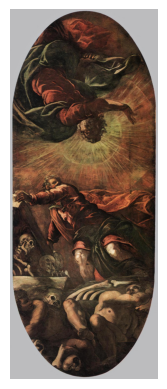

Generated caption:
there is a painting of a painting of a man on a horse
Rank 2:
ID: sample_2800
Artist: tintoretto
Style: Mannerism_Late_Renaissance
Genere: religious_painting
Score: 0.5451




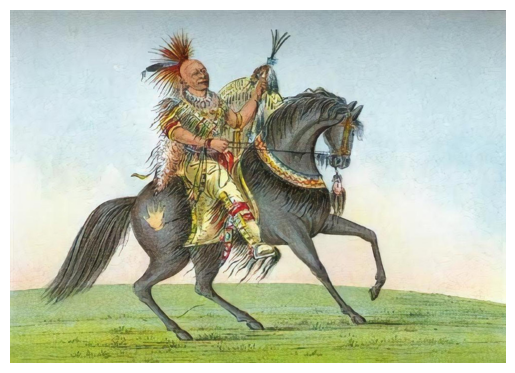

Generated caption:
there is a drawing of a native man riding a horse
Rank 3:
ID: sample_4630
Artist: Unknown Artist
Style: Realism
Genere: portrait
Score: 0.5427




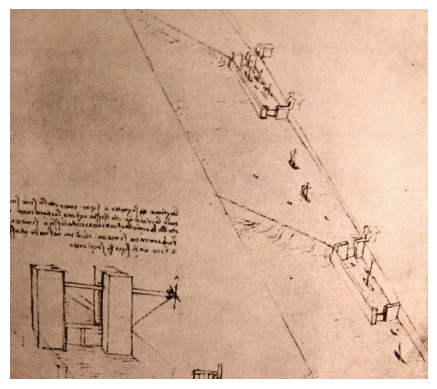

Generated caption:
drawing of a drawing of a man on a horse and a man on a horse
Rank 4:
ID: sample_2294
Artist: leonardo-da-vinci
Style: High_Renaissance
Genere: sketch_and_study
Score: 0.5393




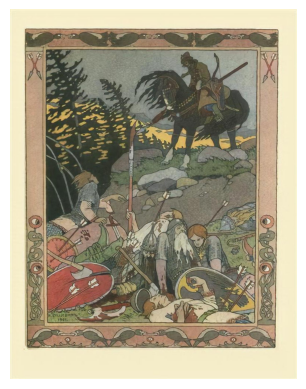

Generated caption:
there is a picture of a painting of a man on a horse
Rank 5:
ID: sample_1459
Artist: ivan-bilibin
Style: Art_Nouveau
Genere: illustration
Score: 0.5280




In [9]:
from demo import caption_to_image, set_new_mapping_location

set_new_mapping_location(project_root / "artifacts" / "type_mappings")

query_text = "A young boy on a horse"
result = caption_to_image(query_text=query_text, top_k=5)

print_separator()
print(f"Query text: {query_text}")
print_separator()
for idx, (img_path, id, artist, style, genere, caption, score) in enumerate(result[::-1]):
    draw_image(str(img_path))
    print("Generated caption:")
    print(caption)
    print(f"Rank {idx + 1}:")
    print(f"ID: {id}")
    print(f"Artist: {artist}")
    print(f"Style: {style}")
    print(f"Genere: {genere}")
    print(f"Score: {score}")
    print_separator()

Результаты относительно неплохие. В целом, система ошибается скорее на действительно сложных изображениях (описания к которыи довольно сомнительны), а также обладает слабой уверенностью (скорее всего это из-за спецификации возроста `young`).

Caption 1: there is a painting of a man in a tuxedo sitting on a chair
Caption 2: an image of a painting of a group of people in a room
Caption 3: there is a painting of a vase filled with red and yellow flowers
Caption 4: there is a painting of two women dressed in black dresses
Caption 5: there is a painting of a woman holding an umbrella in the rain
Caption 6: there is a painting of a man sitting on the ground next to a woman
Caption 7: there is a drawing of a city street with people walking around it
Caption 8: there is a painting of a woman in a black dress standing in a field
Caption 9: there is a painting of a river with a waterfall in the middle of it
Caption 10: there is a drawing of a man sleeping on a bed
Random images from the corpus




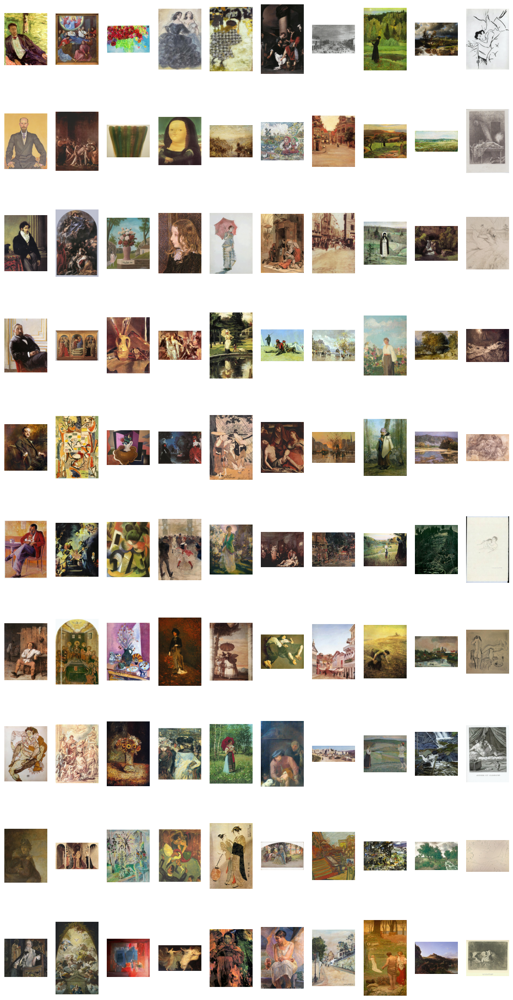

In [12]:
import random

random_captions = random.sample(all_captions, 10)
prediction_image = [
    [
        str(project_root / res[0])
        for res in caption_to_image(query_text=caption, top_k=10)
    ]
    for caption in random_captions
]


white_image = np.ones((100, 100, 3), dtype=np.uint8) * 255

for i, caption in enumerate(random_captions):
    print(f"Caption {i + 1}: {caption}")
print("Random images from the corpus")
print_separator()
draw_image_grid(prediction_image)

## 5. Просмотр примеров работы Omni2Image



Query text: A young boy on a horse




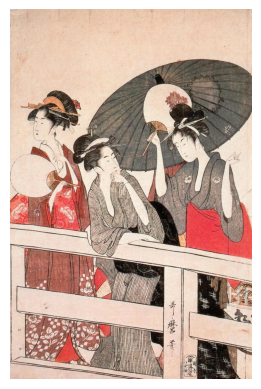

Generated caption:
there are three women standing on a bridge holding umbrellas
Rank 1:
ID: sample_3239
Artist: Unknown Artist
Style: Ukiyo_e
Genere: genre_painting
Score: 0.0584




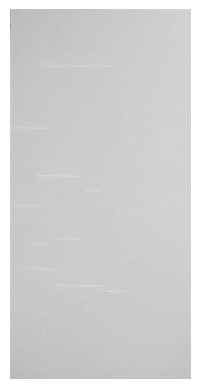

Generated caption:
there is a man that is standing in the snow with a snowboard
Rank 2:
ID: sample_1343
Artist: Unknown Artist
Style: Minimalism
Genere: abstract_painting
Score: 0.0571




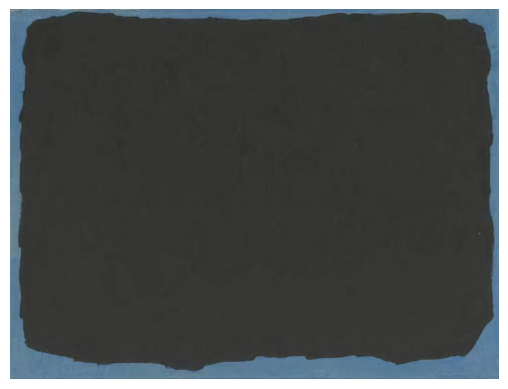

Generated caption:
an image of a black square on a blue background
Rank 3:
ID: sample_3911
Artist: Unknown Artist
Style: Minimalism
Genere: abstract_painting
Score: 0.0547




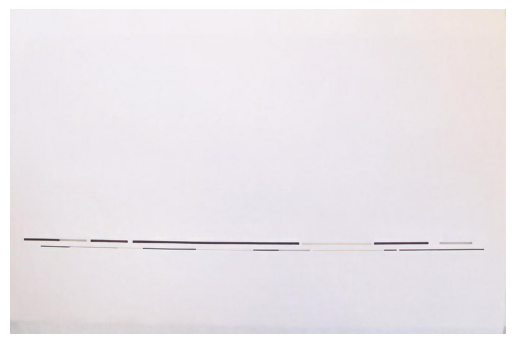

Generated caption:
there is a cat that is sitting on top of a refrigerator
Rank 4:
ID: sample_2750
Artist: Unknown Artist
Style: Minimalism
Genere: abstract_painting
Score: 0.0506




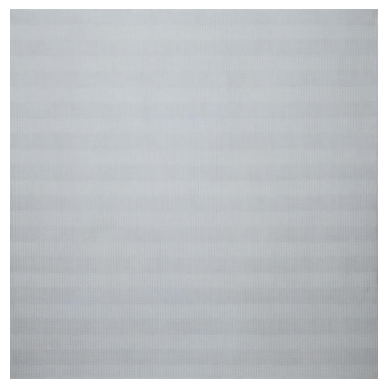

Generated caption:
there is a man that is standing on a surfboard in the water
Rank 5:
ID: sample_1028
Artist: Unknown Artist
Style: Minimalism
Genere: abstract_painting
Score: 0.0473




In [13]:
from demo import omni_to_image, set_new_mapping_location

set_new_mapping_location(project_root / "artifacts" / "type_mappings")

query_text = "A young boy on a horse"
result = omni_to_image(query_text=query_text, styles=["7"], genres=["7"], tags=["boy", "horse"], top_k=5)

print_separator()
print(f"Query text: {query_text}")
print_separator()
for idx, (img_path, id, artist, style, genere, caption, score) in enumerate(result[::-1]):
    draw_image(str(img_path))
    print("Generated caption:")
    print(caption)
    print(f"Rank {idx + 1}:")
    print(f"ID: {id}")
    print(f"Artist: {artist}")
    print(f"Style: {style}")
    print(f"Genere: {genere}")
    print(f"Score: {score}")
    print_separator()